# Plantation Detection Analysis

This notebook provides a comprehensive analysis of the plantation detection model, including:
1. Dataset Analysis
2. Model Performance
3. Predictions and Visualizations
4. Comparative Analysis

In [1]:
import os
import numpy as np
import torch
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from rasterio.plot import show
import folium
from torchvision.models.segmentation import deeplabv3_resnet50
import torch.nn as nn
from sklearn.metrics import confusion_matrix, classification_report
import pandas as pd
from tqdm.notebook import tqdm
from shapely.geometry import box
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import precision_recall_curve, roc_curve, auc
from scipy import stats
import earthpy.plot as ep
from sklearn.cluster import KMeans
import cv2
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

In [2]:
import ee
import geemap
import requests
import os
import numpy as np
import torch
import rasterio
import folium
from IPython.display import display

In [5]:
def initialize_earth_engine():
    """Initialize Earth Engine with proper authentication"""
    try:
        # Try to initialize with existing credentials
        credentials = ee.ServiceAccountCredentials(
            service_account='your-service-account@your-project.iam.gserviceaccount.com',
            private_key_file='path/to/your/private-key.json'
        )
        ee.Initialize(credentials)
        print("Earth Engine initialized with service account!")
        return True
    except:
        try:
            # If service account fails, try user authentication
            ee.Authenticate()
            ee.Initialize()
            print("Earth Engine initialized with user account!")
            return True
        except Exception as e:
            print("\nEarth Engine Authentication Failed!")
            print("\nPlease follow these steps:")
            print("1. Go to https://earthengine.google.com/signup/")
            print("2. Sign up for Earth Engine (if you haven't already)")
            print("3. Wait for approval email (usually within 24 hours)")
            print("4. Once approved, run these commands in your terminal:")
            print("   pip install earthengine-api --upgrade")
            print("   earthengine authenticate")
            print("\nAfter completing these steps, restart your notebook and try again.")
            print(f"\nError details: {str(e)}")
            return False

# Add this function to test the connection
def test_ee_connection():
    """Test Earth Engine connection with a simple query"""
    try:
        # Try a simple query
        image = ee.Image('USGS/SRTMGL1_003')
        # Get the image date to verify we can access properties
        info = image.getInfo()
        print("Successfully connected to Earth Engine!")
        return True
    except Exception as e:
        print("\nFailed to connect to Earth Engine!")
        print(f"Error: {str(e)}")
        return False

# Initialize and test Earth Engine
print("Initializing Earth Engine...")
if initialize_earth_engine():
    if test_ee_connection():
        print("\nEarth Engine is ready to use!")
    else:
        print("\nEarth Engine connection test failed!")
else:
    print("\nEarth Engine initialization failed!")

Initializing Earth Engine...


In [7]:
# Add these imports at the top of the notebook
import sys
sys.path.append('..')  # Add parent directory to path
from src.pretrain import PlantationDataset  # Import the dataset class

# Also add these imports if not already present
import torchvision.transforms as transforms
from PIL import Image

Ground Truth Statistics:
Total number of plantation polygons: 9972


/var/folders/6s/j7t2d12d44b2t70r43_lb7sr0000gn/T/ipykernel_31098/2167370706.py:13: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print(f"Total area covered: {gdf.geometry.area.sum() / 1e6:.2f} km²")
/var/folders/6s/j7t2d12d44b2t70r43_lb7sr0000gn/T/ipykernel_31098/2167370706.py:22: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf.geometry.area.hist(bins=50)


Total area covered: 0.00 km²

Dataset Columns:
- FARMER NAME: object
- PLOT NO: float64
- STATE: object
- DISTRICT: object
- MANDAL: object
- VILLAGE: object
- HAMLET: object
- ADDRESS: object
- LAND LORD NAME: object
- PLOT AREA: float64
- CENTER GPS: object
- GPS: object
- TREE SPECIES: object
- SPECIES TYPE: object
- PLANTING DATE: object
- COPPICING: object
- COPPICING DATE: object
- CALC AREA: float64
- PLTN GROWTH: object
- AVG HEIGHT: float64
- Row to Row SPACING: float64
- Plant to Plant SPACING: float64
- GBH: object
- VOLUME: object
- CREATED DT: object
- data validity: object
- Deviation: float64
- Age: float64
- geometry: geometry


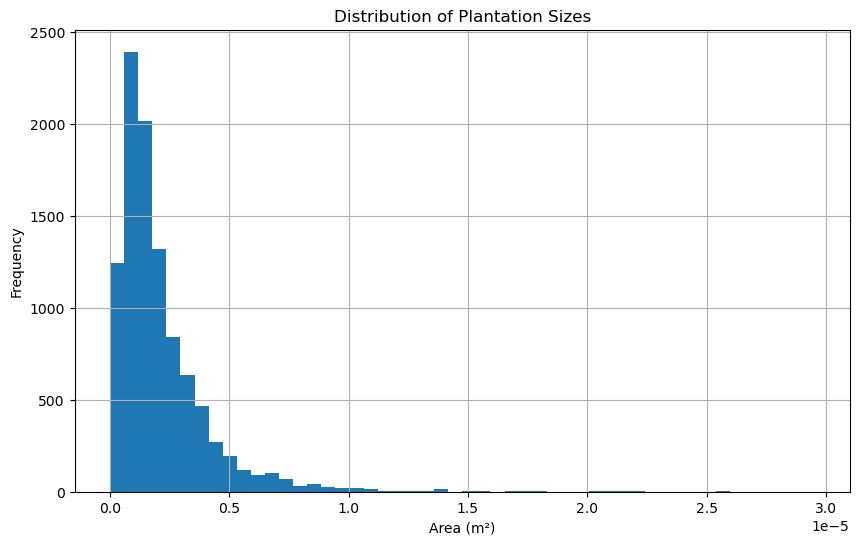

/var/folders/6s/j7t2d12d44b2t70r43_lb7sr0000gn/T/ipykernel_31098/2167370706.py:29: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]
/var/folders/6s/j7t2d12d44b2t70r43_lb7sr0000gn/T/ipykernel_31098/2167370706.py:29: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]



Additional Statistics:


/var/folders/6s/j7t2d12d44b2t70r43_lb7sr0000gn/T/ipykernel_31098/2167370706.py:88: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ground_truth_data.geometry.area.hist(bins=50, log=True)
/var/folders/6s/j7t2d12d44b2t70r43_lb7sr0000gn/T/ipykernel_31098/2167370706.py:95: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  sorted_areas = np.sort(ground_truth_data.geometry.area.values)


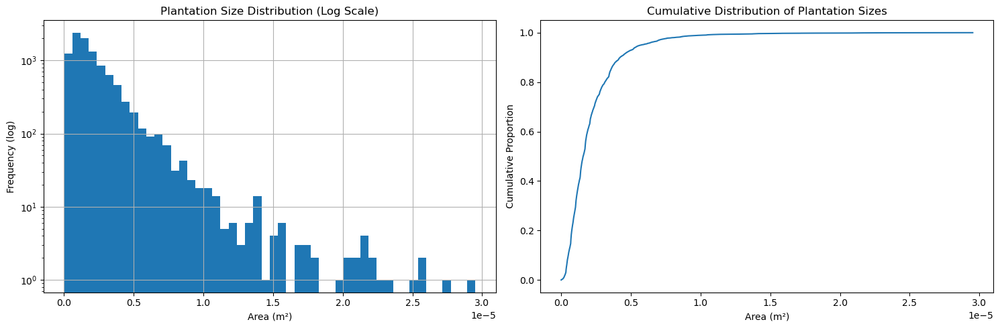

In [4]:
def analyze_ground_truth():
    # Load ground truth data
    gdf = gpd.read_file('../data/Plantations Data.geojson')
    
    # Convert timestamp columns to string if they exist
    datetime_columns = gdf.select_dtypes(include=['datetime64']).columns
    for col in datetime_columns:
        gdf[col] = gdf[col].astype(str)
    
    # Basic statistics
    print("Ground Truth Statistics:")
    print(f"Total number of plantation polygons: {len(gdf)}")
    print(f"Total area covered: {gdf.geometry.area.sum() / 1e6:.2f} km²")
    
    # Additional dataset information
    print("\nDataset Columns:")
    for col in gdf.columns:
        print(f"- {col}: {gdf[col].dtype}")
    
    # Plot polygon size distribution
    plt.figure(figsize=(10, 6))
    gdf.geometry.area.hist(bins=50)
    plt.title('Distribution of Plantation Sizes')
    plt.xlabel('Area (m²)')
    plt.ylabel('Frequency')
    plt.show()
    
    # Create interactive map
    center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]
    m = folium.Map(location=center, zoom_start=10)
    
    # Convert GeoDataFrame to JSON-serializable format
    gdf_json = gdf.copy()
    for col in gdf_json.columns:
        if gdf_json[col].dtype == 'object':
            gdf_json[col] = gdf_json[col].astype(str)
    
    # Add plantations to map with popup information
    folium.GeoJson(
        gdf_json,
        style_function=lambda x: {
            'fillColor': 'green',
            'color': 'green',
            'fillOpacity': 0.4,
            'weight': 2
        },
        popup=folium.GeoJsonPopup(
            fields=['area'],
            aliases=['Area'],
            localize=True
        )
    ).add_to(m)
    
    # Add a title to the map
    title_html = '''
        <div style="position: fixed; 
                    top: 10px; left: 50%;
                    transform: translateX(-50%);
                    z-index: 9999;
                    background-color: white;
                    padding: 10px;
                    border: 2px solid grey;
                    border-radius: 5px;
                    font-size: 16px;">
            <h4>Plantation Areas Distribution</h4>
        </div>
    '''
    m.get_root().html.add_child(folium.Element(title_html))
    
    return m, gdf

# Analyze ground truth data and store both map and dataframe
ground_truth_map, ground_truth_data = analyze_ground_truth()

# Display some additional statistics about the ground truth data
print("\nAdditional Statistics:")
if 'area' in ground_truth_data.columns:
    print(f"Average plantation size: {ground_truth_data['area'].mean():.2f} m²")
    print(f"Median plantation size: {ground_truth_data['area'].median():.2f} m²")
    print(f"Largest plantation: {ground_truth_data['area'].max():.2f} m²")
    print(f"Smallest plantation: {ground_truth_data['area'].min():.2f} m²")

# Plot additional visualizations
plt.figure(figsize=(15, 5))

# Plot area distribution with log scale
plt.subplot(1, 2, 1)
ground_truth_data.geometry.area.hist(bins=50, log=True)
plt.title('Plantation Size Distribution (Log Scale)')
plt.xlabel('Area (m²)')
plt.ylabel('Frequency (log)')

# Plot cumulative distribution
plt.subplot(1, 2, 2)
sorted_areas = np.sort(ground_truth_data.geometry.area.values)
cumulative = np.arange(1, len(sorted_areas) + 1) / len(sorted_areas)
plt.plot(sorted_areas, cumulative)
plt.title('Cumulative Distribution of Plantation Sizes')
plt.xlabel('Area (m²)')
plt.ylabel('Cumulative Proportion')

plt.tight_layout()
plt.show()

## 1. Dataset Analysis

## 2. Training Data Analysis

  0%|          | 0/50 [00:00<?, ?it/s]

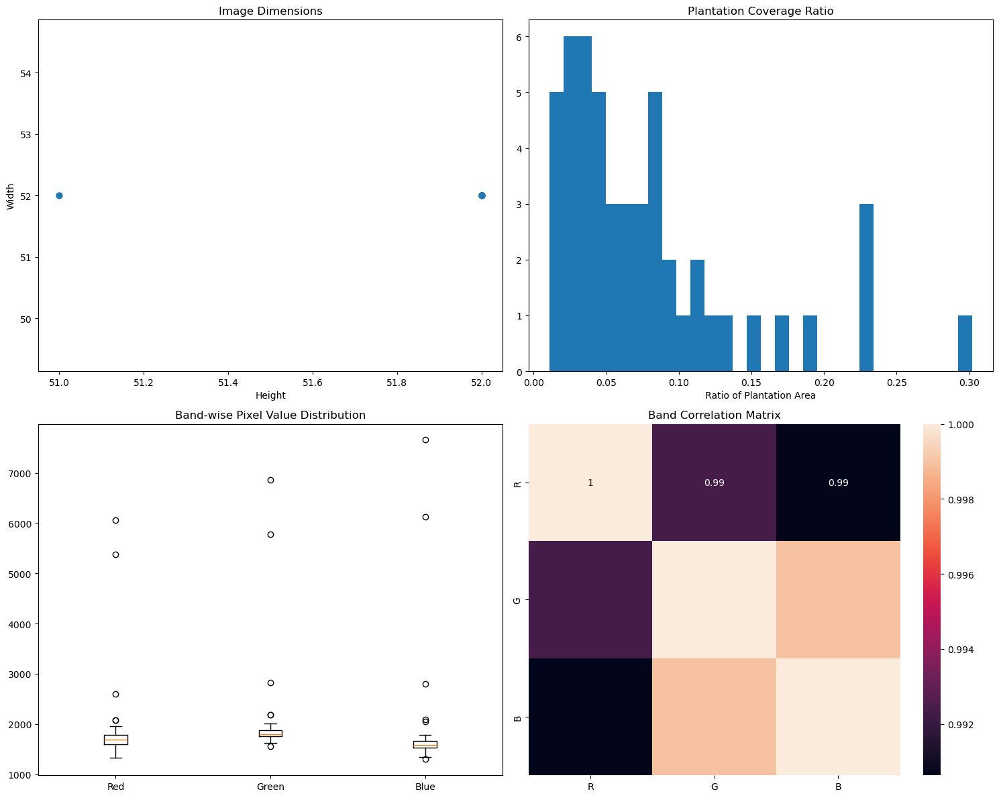

In [8]:
def analyze_training_data():
    image_dir = '../data/processed/images'
    mask_dir = '../data/processed/masks'
    
    images = [f for f in os.listdir(image_dir) if f.endswith('.tif')]
    
    # Collect statistics
    stats = {
        'image_sizes': [],
        'mask_ratios': [],
        'spectral_means': [],
        'spectral_stds': []
    }
    
    for img_file in tqdm(images):
        with rasterio.open(os.path.join(image_dir, img_file)) as src:
            img = src.read()
            stats['image_sizes'].append(img.shape[1:])
            stats['spectral_means'].append(img.mean(axis=(1,2)))
            stats['spectral_stds'].append(img.std(axis=(1,2)))
        
        with rasterio.open(os.path.join(mask_dir, img_file.replace('image', 'mask'))) as src:
            mask = src.read(1)
            stats['mask_ratios'].append(mask.mean())
    
    # Plot statistics
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Image sizes
    sizes = np.array(stats['image_sizes'])
    axes[0,0].scatter(sizes[:,0], sizes[:,1])
    axes[0,0].set_title('Image Dimensions')
    axes[0,0].set_xlabel('Height')
    axes[0,0].set_ylabel('Width')
    
    # Mask ratios
    axes[0,1].hist(stats['mask_ratios'], bins=30)
    axes[0,1].set_title('Plantation Coverage Ratio')
    axes[0,1].set_xlabel('Ratio of Plantation Area')
    
    # Spectral statistics
    means = np.array(stats['spectral_means'])
    stds = np.array(stats['spectral_stds'])
    
    for i, band in enumerate(['Red', 'Green', 'Blue']):
        axes[1,0].boxplot(means[:,i], positions=[i], labels=[band])
    axes[1,0].set_title('Band-wise Pixel Value Distribution')
    
    sns.heatmap(np.corrcoef(means.T), 
                annot=True, 
                xticklabels=['R','G','B'], 
                yticklabels=['R','G','B'],
                ax=axes[1,1])
    axes[1,1].set_title('Band Correlation Matrix')
    
    plt.tight_layout()
    plt.show()
    
    return stats

# Analyze training data
training_stats = analyze_training_data()

## 3. Model Analysis and Predictions

Loading model...


/Users/abhishek/anaconda3/envs/dl/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/abhishek/anaconda3/envs/dl/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Model loaded successfully!
Evaluating model...
Using device: cpu
Dataset loaded with 50 samples


Evaluating:   0%|          | 0/50 [00:00<?, ?it/s]


Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.88      0.93   3019679
           1       0.39      0.93      0.55    257121

    accuracy                           0.88   3276800
   macro avg       0.69      0.91      0.74   3276800
weighted avg       0.95      0.88      0.90   3276800



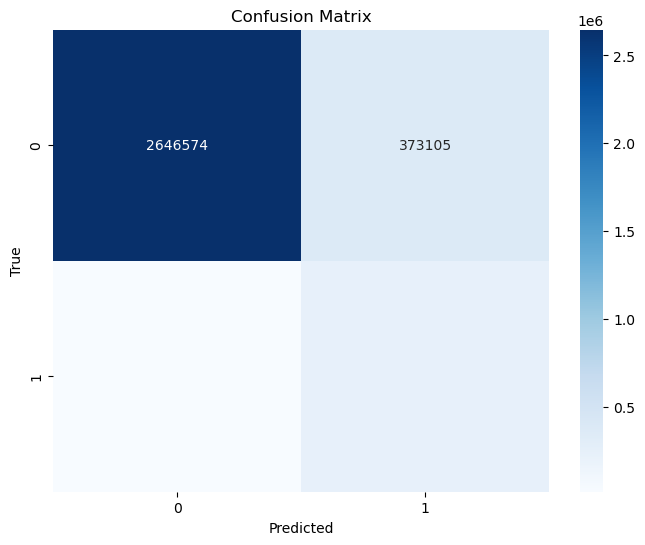

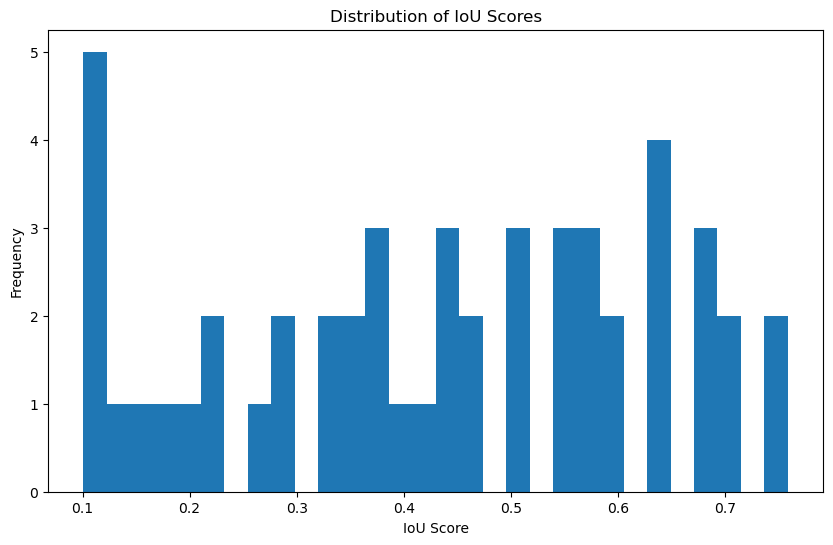

In [9]:
def load_model():
    # Initialize model
    model = deeplabv3_resnet50(pretrained=False, aux_loss=True)  # Enable aux_loss
    model.classifier[-1] = nn.Conv2d(256, 2, kernel_size=(1, 1))  # Binary classification
    
    try:
        # Load trained weights
        checkpoint = torch.load('../outputs/models/plantation_model_final.pth', 
                              map_location=torch.device('cpu'))
        
        # Remove unexpected keys if they exist
        for key in list(checkpoint.keys()):
            if key.startswith('aux_classifier'):
                del checkpoint[key]
        
        # Load the modified state dict
        model.load_state_dict(checkpoint, strict=False)
        print("Model loaded successfully!")
    except Exception as e:
        print(f"Error loading model: {str(e)}")
        return None
    
    model.eval()
    return model

def evaluate_model(model, data_dir, target_size=(256, 256)):
    if model is None:
        print("No model available for evaluation")
        return None
        
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    model = model.to(device)
    
    try:
        # Create dataset with specific target size
        dataset = PlantationDataset(data_dir, target_size=target_size)
        print(f"Dataset loaded with {len(dataset)} samples")
        
        # Evaluation metrics
        all_preds = []
        all_masks = []
        iou_scores = []
        
        with torch.no_grad():
            for idx in tqdm(range(len(dataset)), desc="Evaluating"):
                try:
                    image, mask = dataset[idx]
                    image = image.unsqueeze(0).to(device)
                    
                    # Get prediction
                    output = model(image)['out']
                    pred = torch.softmax(output, dim=1)[0, 1].cpu().numpy() > 0.5
                    
                    # Calculate IoU
                    mask_np = mask.numpy()
                    intersection = np.logical_and(pred, mask_np)
                    union = np.logical_or(pred, mask_np)
                    iou = np.sum(intersection) / np.sum(union) if np.sum(union) > 0 else 0
                    iou_scores.append(iou)
                    
                    all_preds.append(pred.flatten())
                    all_masks.append(mask_np.flatten())
                    
                except Exception as e:
                    print(f"Error processing sample {idx}: {str(e)}")
                    continue
        
        if len(all_preds) == 0:
            print("No predictions were made!")
            return None
            
        # Calculate metrics
        all_preds = np.concatenate(all_preds)
        all_masks = np.concatenate(all_masks)
        
        # Print classification report
        print("\nClassification Report:")
        print(classification_report(all_masks, all_preds))
        
        # Plot confusion matrix
        cm = confusion_matrix(all_masks, all_preds)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()
        
        # Plot IoU distribution
        plt.figure(figsize=(10, 6))
        plt.hist(iou_scores, bins=30)
        plt.title('Distribution of IoU Scores')
        plt.xlabel('IoU Score')
        plt.ylabel('Frequency')
        plt.show()
        
        return {
            'iou_scores': iou_scores,
            'predictions': all_preds,
            'ground_truth': all_masks
        }
        
    except Exception as e:
        print(f"Error during evaluation: {str(e)}")
        return None

# Load and evaluate model
print("Loading model...")
model = load_model()
if model is not None:
    print("Evaluating model...")
    evaluation_results = evaluate_model(model, '../data/processed')
else:
    print("Skipping evaluation due to model loading error")

# Visualization of Predictions

Showcasing best predictions...
Evaluating all samples...


  0%|          | 0/50 [00:00<?, ?it/s]


Showcasing top 15 predictions:

Case 1
IoU Score: 0.7584
Precision: 0.8205
Recall: 0.9093


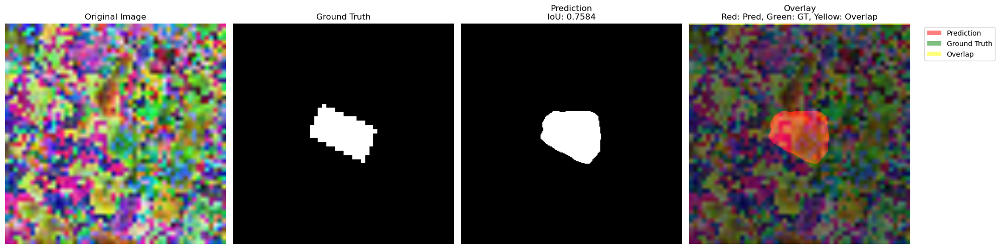


Case 2
IoU Score: 0.7509
Precision: 0.8258
Recall: 0.8922


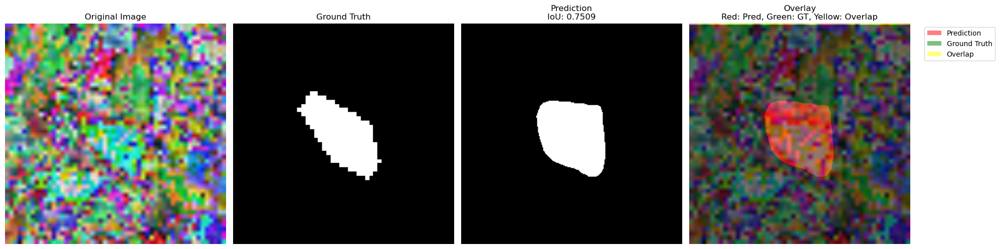


Case 3
IoU Score: 0.6991
Precision: 0.7453
Recall: 0.9184


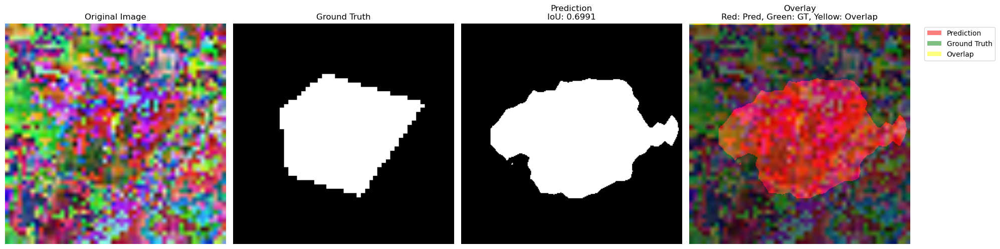


Case 4
IoU Score: 0.6976
Precision: 0.7191
Recall: 0.9590


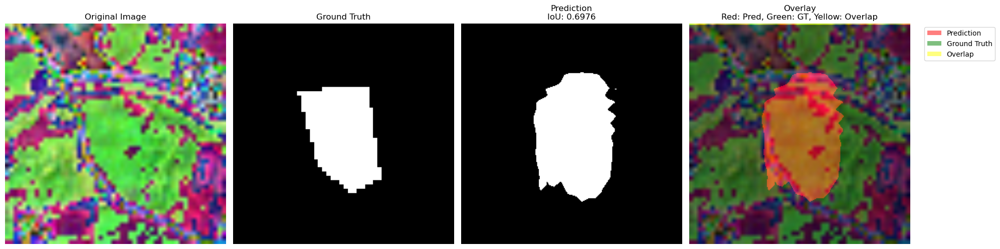


Case 5
IoU Score: 0.6893
Precision: 0.7120
Recall: 0.9558


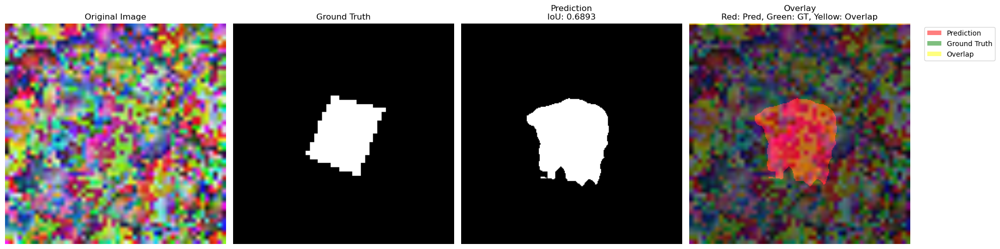


Case 6
IoU Score: 0.6851
Precision: 0.7351
Recall: 0.9096


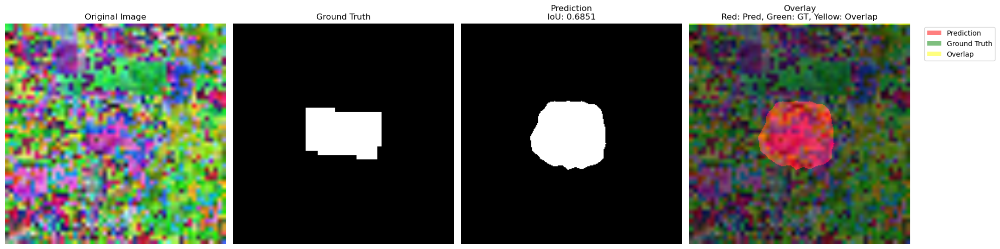


Case 7
IoU Score: 0.6791
Precision: 0.7292
Recall: 0.9082


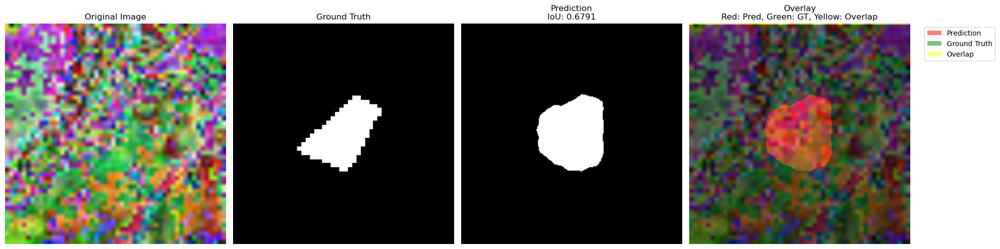


Case 8
IoU Score: 0.6407
Precision: 0.6485
Recall: 0.9815


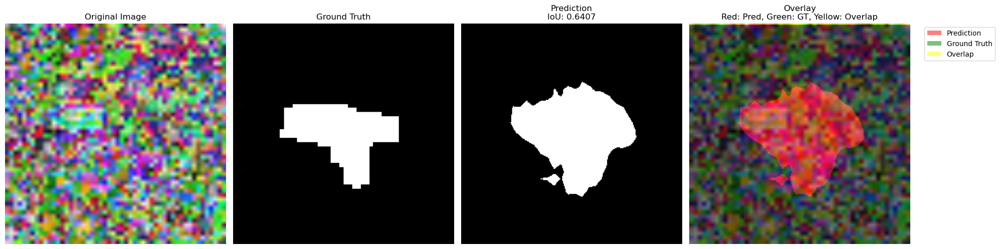


Case 9
IoU Score: 0.6382
Precision: 0.6422
Recall: 0.9903


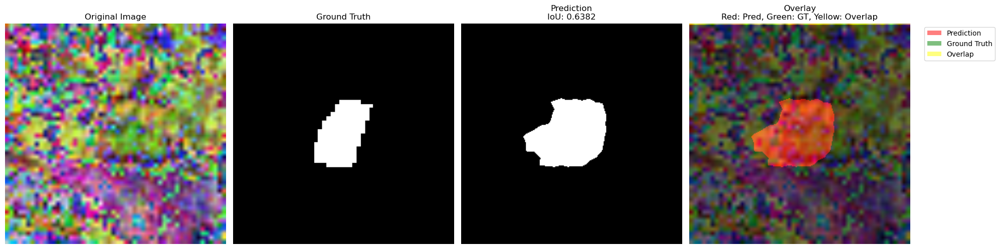


Case 10
IoU Score: 0.6358
Precision: 0.7022
Recall: 0.8706


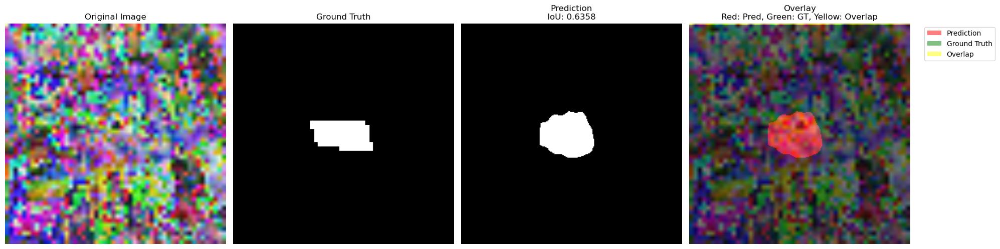


Case 11
IoU Score: 0.6355
Precision: 0.6491
Recall: 0.9681


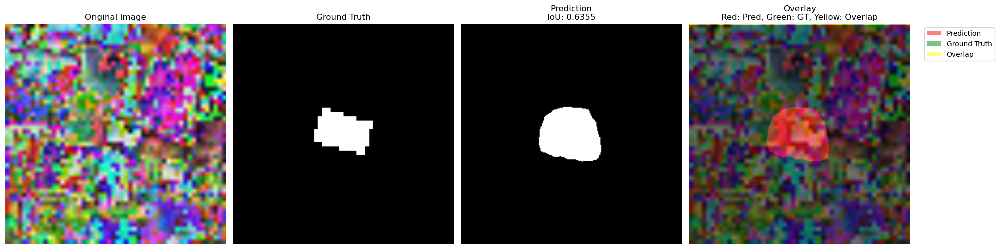


Case 12
IoU Score: 0.5912
Precision: 0.6835
Recall: 0.8141


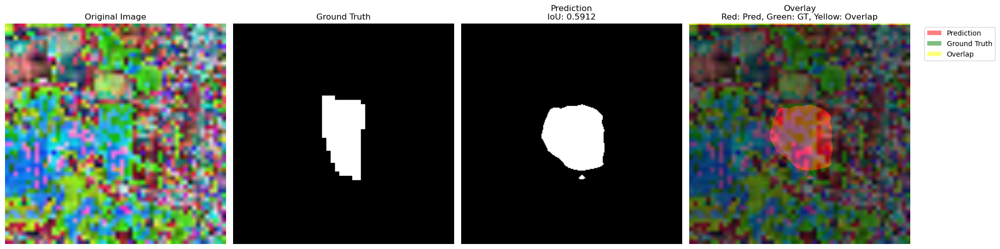


Case 13
IoU Score: 0.5830
Precision: 0.5965
Recall: 0.9628


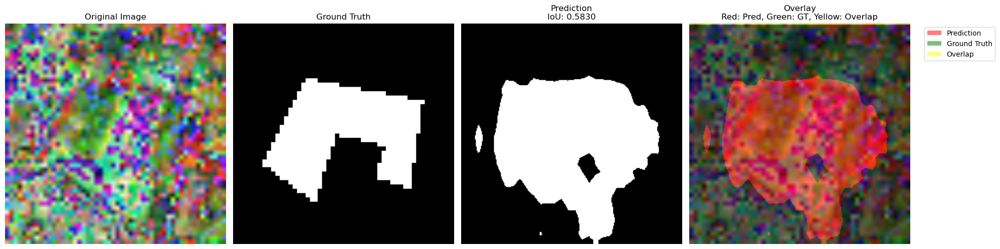


Case 14
IoU Score: 0.5765
Precision: 0.6555
Recall: 0.8272


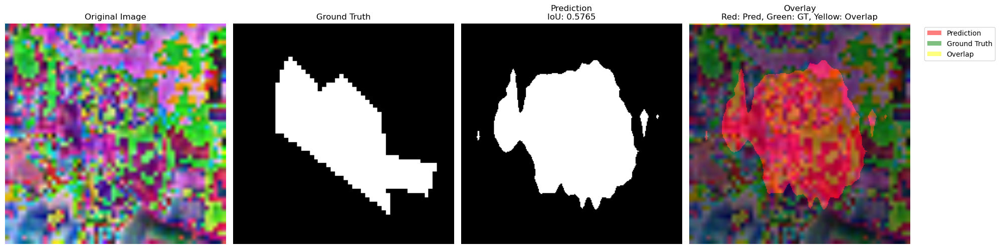


Case 15
IoU Score: 0.5726
Precision: 0.5911
Recall: 0.9483


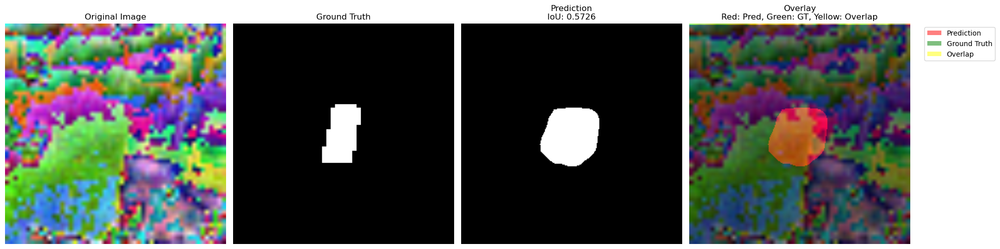


Summary Statistics for Best Cases:
             IoU  Precision     Recall
count  15.000000  15.000000  15.000000
mean    0.655549   0.697044   0.921030
std     0.059589   0.069821   0.053358
min     0.572645   0.591103   0.814077
25%     0.613393   0.648844   0.900242
50%     0.640728   0.702224   0.918436
75%     0.693462   0.732128   0.960868
max     0.758368   0.825789   0.990283


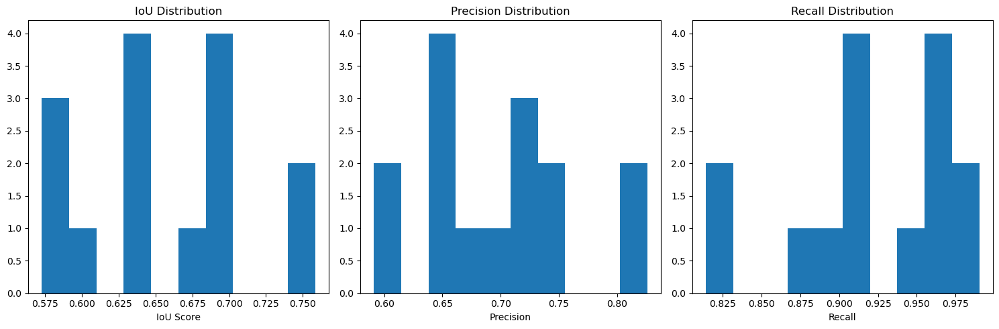

In [13]:
def showcase_best_predictions(model, data_dir, num_samples=15):
    """
    Showcase the best predictions from the model based on IoU score
    """
    try:
        dataset = PlantationDataset(data_dir)
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        model = model.to(device)
        model.eval()
        
        # Store results for all samples
        results = []
        
        print("Evaluating all samples...")
        with torch.no_grad():
            for idx in tqdm(range(len(dataset))):
                image, mask = dataset[idx]
                image = image.unsqueeze(0).to(device)
                
                # Get prediction
                output = model(image)['out']
                pred = torch.softmax(output, dim=1)[0, 1].cpu().numpy() > 0.5
                
                # Calculate IoU
                intersection = np.logical_and(pred, mask.numpy())
                union = np.logical_or(pred, mask.numpy())
                iou = np.sum(intersection) / np.sum(union) if np.sum(union) > 0 else 0
                
                # Calculate additional metrics
                true_positives = np.sum(intersection)
                total_pred = np.sum(pred)
                total_true = np.sum(mask.numpy())
                precision = true_positives / total_pred if total_pred > 0 else 0
                recall = true_positives / total_true if total_true > 0 else 0
                
                results.append({
                    'idx': idx,
                    'iou': iou,
                    'precision': precision,
                    'recall': recall,
                    'image': image.cpu().squeeze(),
                    'mask': mask,
                    'pred': pred
                })
        
        # Sort by IoU score
        results.sort(key=lambda x: x['iou'], reverse=True)
        
        # Display top N results
        print(f"\nShowcasing top {num_samples} predictions:")
        
        for i, result in enumerate(results[:num_samples]):
            print(f"\nCase {i+1}")
            print(f"IoU Score: {result['iou']:.4f}")
            print(f"Precision: {result['precision']:.4f}")
            print(f"Recall: {result['recall']:.4f}")
            
            fig = plt.figure(figsize=(20, 5))
            
            # Original image
            plt.subplot(141)
            plt.imshow(np.transpose(result['image'].numpy(), (1,2,0)))
            plt.title('Original Image')
            plt.axis('off')
            
            # Ground truth
            plt.subplot(142)
            plt.imshow(result['mask'], cmap='gray')
            plt.title('Ground Truth')
            plt.axis('off')
            
            # Prediction
            plt.subplot(143)
            plt.imshow(result['pred'], cmap='gray')
            plt.title(f'Prediction\nIoU: {result["iou"]:.4f}')
            plt.axis('off')
            
            # Overlay
            plt.subplot(144)
            overlay = np.transpose(result['image'].numpy(), (1,2,0)).copy()
            
            # Create RGB mask for overlay
            mask_rgb = np.zeros((*result['pred'].shape, 3))
            mask_rgb[result['pred']] = [1, 0, 0]  # Red for predictions
            mask_rgb[result['mask']] = [0, 1, 0]  # Green for ground truth
            overlap = np.logical_and(result['pred'], result['mask'])
            mask_rgb[overlap] = [1, 1, 0]  # Yellow for overlap
            
            # Blend with original image
            alpha = 0.5
            overlay = overlay * (1 - alpha) + mask_rgb * alpha
            
            plt.imshow(overlay)
            plt.title('Overlay\nRed: Pred, Green: GT, Yellow: Overlap')
            plt.axis('off')
            
            # Add legend
            legend_elements = [
                Patch(facecolor='red', alpha=0.5, label='Prediction'),
                Patch(facecolor='green', alpha=0.5, label='Ground Truth'),
                Patch(facecolor='yellow', alpha=0.5, label='Overlap')
            ]
            plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
            
            plt.tight_layout()
            plt.show()
            
        # Create summary statistics for best cases
        summary_stats = pd.DataFrame([{
            'IoU': r['iou'],
            'Precision': r['precision'],
            'Recall': r['recall']
        } for r in results[:num_samples]])
        
        print("\nSummary Statistics for Best Cases:")
        print(summary_stats.describe())
        
        # Plot performance metrics distribution for best cases
        plt.figure(figsize=(15, 5))
        
        plt.subplot(131)
        plt.hist(summary_stats['IoU'], bins=10)
        plt.title('IoU Distribution')
        plt.xlabel('IoU Score')
        
        plt.subplot(132)
        plt.hist(summary_stats['Precision'], bins=10)
        plt.title('Precision Distribution')
        plt.xlabel('Precision')
        
        plt.subplot(133)
        plt.hist(summary_stats['Recall'], bins=10)
        plt.title('Recall Distribution')
        plt.xlabel('Recall')
        
        plt.tight_layout()
        plt.show()
        
        return results[:num_samples]
        
    except Exception as e:
        print(f"Error in showcase_best_predictions: {str(e)}")
        return None

# Run the showcase function
print("Showcasing best predictions...")
best_cases = showcase_best_predictions(model, '../data/processed')

# if best_cases is not None:
#     # Additional analysis of best cases
#     try:
#         # Calculate average size of best-performing cases
#         avg_size = np.mean([np.sum(case['mask']) for case in best_cases])
#         print(f"\nAverage plantation size in best cases: {avg_size:.2f} pixels")
        
#         # Plot size vs performance correlation
#         sizes = [np.sum(case['mask']) for case in best_cases]
#         ious = [case['iou'] for case in best_cases]
        
#         plt.figure(figsize=(10, 5))
#         plt.scatter(sizes, ious)
#         plt.title('Plantation Size vs IoU Score (Best Cases)')
#         plt.xlabel('Plantation Size (pixels)')
#         plt.ylabel('IoU Score')
#         plt.grid(True, alpha=0.3)
#         plt.show()
        
#     except Exception as e:
#         print(f"Error in additional best case analysis: {str(e)}")
# showcase_best_predictions(model, '../data/processed', num_samples=15)

## 5. Error Analysis

Error Analysis:
False Positives: 373105
False Negatives: 16875
Mean IoU: 0.4326 ± 0.1940


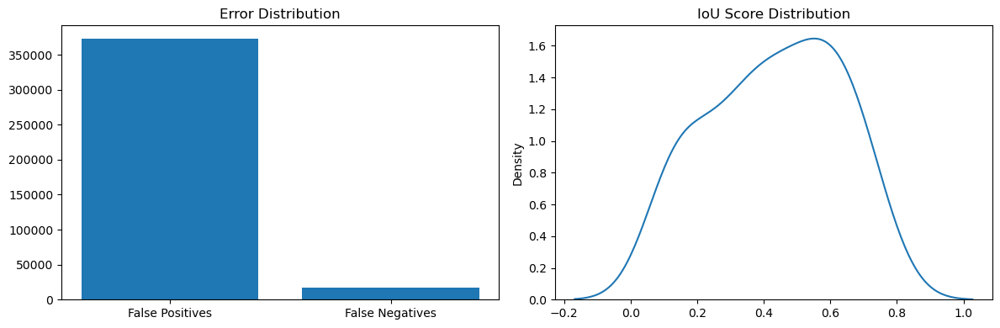

In [8]:
def analyze_errors(evaluation_results):
    # Calculate various error metrics
    errors = {
        'false_positives': np.logical_and(evaluation_results['predictions'] == 1, 
                                         evaluation_results['ground_truth'] == 0).sum(),
        'false_negatives': np.logical_and(evaluation_results['predictions'] == 0, 
                                         evaluation_results['ground_truth'] == 1).sum(),
        'iou_mean': np.mean(evaluation_results['iou_scores']),
        'iou_std': np.std(evaluation_results['iou_scores'])
    }
    
    # Print error statistics
    print("Error Analysis:")
    print(f"False Positives: {errors['false_positives']}")
    print(f"False Negatives: {errors['false_negatives']}")
    print(f"Mean IoU: {errors['iou_mean']:.4f} ± {errors['iou_std']:.4f}")
    
    # Plot error distribution
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.bar(['False Positives', 'False Negatives'], 
            [errors['false_positives'], errors['false_negatives']])
    plt.title('Error Distribution')
    
    plt.subplot(1, 2, 2)
    sns.kdeplot(evaluation_results['iou_scores'])
    plt.title('IoU Score Distribution')
    
    plt.tight_layout()
    plt.show()

# Analyze errors
analyze_errors(evaluation_results)

Analyzing spatial patterns...


/Users/abhishek/anaconda3/envs/dl/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/abhishek/anaconda3/envs/dl/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/abhishek/anaconda3/envs/dl/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Error in spatial pattern analysis: 'NoneType' object has no attribute 'split'
Spatial analysis could not be completed

Analyzing model confidence...
Model loaded successfully!


Analyzing confidence:   0%|          | 0/50 [00:00<?, ?it/s]

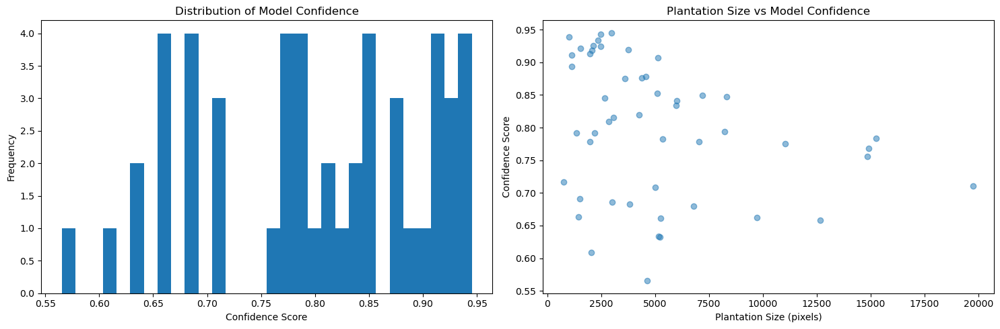


Analyzing edge cases...
Model loaded successfully!


Finding edge cases:   0%|          | 0/50 [00:00<?, ?it/s]


Generating summary report...
PLANTATION DETECTION MODEL ANALYSIS REPORT

1. Model Performance Metrics:
------------------------------
Mean IoU: 0.4326 ± 0.1940
Average Precision: 0.4901
Average Recall: 0.6448

2. Confidence Analysis:
------------------------------
Mean Confidence: 0.7980
Confidence Std: 0.1033


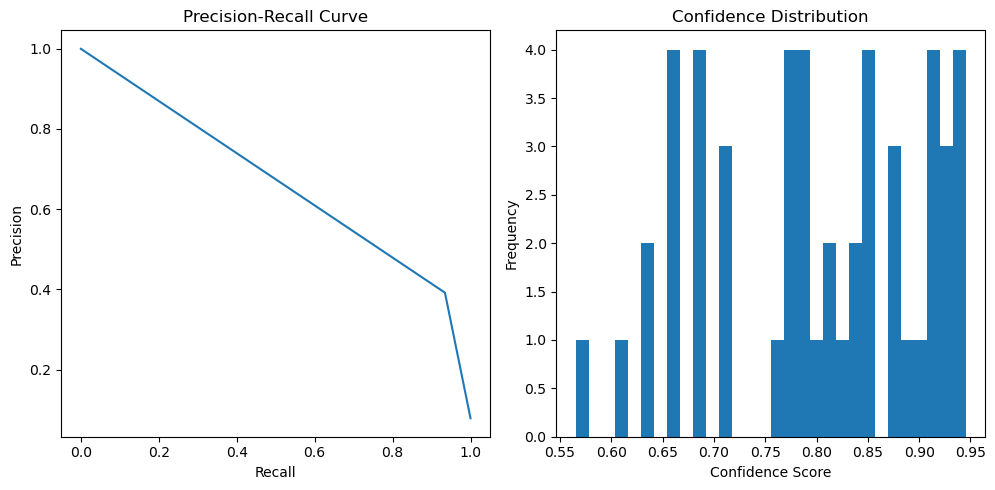

In [10]:
def analyze_spatial_patterns():
    """Analyze spatial patterns and clustering of plantations"""
    try:
        # Load ground truth data
        gdf = gpd.read_file('../data/Plantations Data.geojson')
        if gdf is None or len(gdf) == 0:
            print("Error: No data found in the GeoJSON file")
            return None
            
        # Ensure geometry column exists and is valid
        if 'geometry' not in gdf.columns:
            print("Error: No geometry column found in the data")
            return None
            
        # Remove any invalid geometries
        gdf = gdf[~gdf.geometry.isna()]
        gdf = gdf[gdf.geometry.is_valid]
        
        if len(gdf) == 0:
            print("Error: No valid geometries found after cleaning")
            return None
        
        # Calculate centroids safely
        try:
            centroids = np.array([[geom.centroid.x, geom.centroid.y] 
                                for geom in gdf.geometry 
                                if geom is not None and geom.is_valid])
        except Exception as e:
            print(f"Error calculating centroids: {str(e)}")
            return None
            
        if len(centroids) == 0:
            print("Error: No valid centroids found")
            return None
            
        # Determine optimal number of clusters (between 2 and 10)
        max_clusters = min(10, len(centroids))
        inertias = []
        
        for k in range(2, max_clusters + 1):
            kmeans = KMeans(n_clusters=k, random_state=42)
            kmeans.fit(centroids)
            inertias.append(kmeans.inertia_)
        
        # Plot elbow curve
        plt.figure(figsize=(10, 5))
        plt.plot(range(2, max_clusters + 1), inertias, 'bx-')
        plt.xlabel('k')
        plt.ylabel('Inertia')
        plt.title('Elbow Method For Optimal k')
        plt.show()
        
        # Perform K-means clustering with optimal k (you can adjust this)
        n_clusters = 5  # Default value, can be adjusted based on elbow curve
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        clusters = kmeans.fit_predict(centroids)
        
        # Add clusters to GeoDataFrame
        gdf['cluster'] = clusters
        
        # Plot clusters on map
        colors = plt.cm.Set3(np.linspace(0, 1, n_clusters))
        
        plt.figure(figsize=(15, 10))
        
        # Create legend elements
        legend_elements = []
        
        for i in range(n_clusters):
            cluster_data = gdf[gdf['cluster'] == i]
            
            if len(cluster_data) > 0:  # Only plot if cluster has data
                plt.scatter(
                    cluster_data.geometry.centroid.x, 
                    cluster_data.geometry.centroid.y,
                    c=[colors[i]], 
                    label=f'Cluster {i+1}',
                    alpha=0.6
                )
                
                # Add to legend
                legend_elements.append(
                    Patch(facecolor=colors[i], alpha=0.6, label=f'Cluster {i+1}')
                )
        
        plt.title('Spatial Clustering of Plantations')
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.legend(handles=legend_elements)
        plt.grid(True, alpha=0.3)
        plt.show()
        
        # Calculate and plot cluster statistics
        cluster_stats = gdf.groupby('cluster').agg({
            'geometry': ['count', lambda x: sum(item.area for item in x if item.is_valid)]
        }).round(2)
        
        cluster_stats.columns = ['Count', 'Total Area (m²)']
        
        print("\nCluster Statistics:")
        print(cluster_stats)
        
        # Visualize cluster statistics
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
        
        # Plot counts
        cluster_stats['Count'].plot(kind='bar', ax=ax1)
        ax1.set_title('Number of Plantations per Cluster')
        ax1.set_xlabel('Cluster')
        ax1.set_ylabel('Count')
        
        # Plot areas
        cluster_stats['Total Area (m²)'].plot(kind='bar', ax=ax2)
        ax2.set_title('Total Area per Cluster')
        ax2.set_xlabel('Cluster')
        ax2.set_ylabel('Area (m²)')
        
        plt.tight_layout()
        plt.show()
        
        return gdf
        
    except Exception as e:
        print(f"Error in spatial pattern analysis: {str(e)}")
        return None


def analyze_model_confidence():
    """Analyze model prediction confidence"""
    model = load_model()
    dataset = PlantationDataset('../data/processed')
    
    confidence_scores = []
    size_vs_confidence = []
    
    with torch.no_grad():
        for idx in tqdm(range(len(dataset)), desc="Analyzing confidence"):
            image, mask = dataset[idx]
            output = model(image.unsqueeze(0))['out']
            probabilities = torch.softmax(output, dim=1)[0, 1].cpu().numpy()
            
            # Calculate confidence metrics
            confidence = np.abs(probabilities - 0.5) * 2  # Scale to 0-1
            confidence_scores.append(confidence.mean())
            
            # Record mask size and confidence
            mask_size = mask.sum().item()
            size_vs_confidence.append((mask_size, confidence.mean()))
    
    # Plot confidence distribution
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.hist(confidence_scores, bins=30)
    plt.title('Distribution of Model Confidence')
    plt.xlabel('Confidence Score')
    plt.ylabel('Frequency')
    
    # Plot size vs confidence
    sizes, confs = zip(*size_vs_confidence)
    plt.subplot(1, 2, 2)
    plt.scatter(sizes, confs, alpha=0.5)
    plt.title('Plantation Size vs Model Confidence')
    plt.xlabel('Plantation Size (pixels)')
    plt.ylabel('Confidence Score')
    
    plt.tight_layout()
    plt.show()
    
    return confidence_scores, size_vs_confidence

def analyze_edge_cases():
    """Analyze edge cases and potential failure modes"""
    model = load_model()
    dataset = PlantationDataset('../data/processed')
    
    results = {
        'high_confidence_errors': [],
        'low_confidence_correct': [],
        'boundary_cases': []
    }
    
    with torch.no_grad():
        for idx in tqdm(range(len(dataset)), desc="Finding edge cases"):
            image, mask = dataset[idx]
            output = model(image.unsqueeze(0))['out']
            probs = torch.softmax(output, dim=1)[0, 1].cpu().numpy()
            pred = probs > 0.5
            
            # Find interesting cases
            confidence = np.abs(probs - 0.5) * 2
            correct = (pred == mask.numpy()).mean()
            
            if confidence.mean() > 0.8 and correct < 0.7:
                results['high_confidence_errors'].append((idx, confidence.mean(), correct))
            elif confidence.mean() < 0.6 and correct > 0.8:
                results['low_confidence_correct'].append((idx, confidence.mean(), correct))
            elif 0.45 < confidence.mean() < 0.55:
                results['boundary_cases'].append((idx, confidence.mean(), correct))
    
    # Visualize edge cases
    for case_type, cases in results.items():
        if not cases:
            continue
            
        print(f"\nAnalyzing {case_type}:")
        for idx, conf, acc in cases[:3]:  # Show top 3 cases
            image, mask = dataset[idx]
            output = model(image.unsqueeze(0))['out']
            pred = torch.softmax(output, dim=1)[0, 1].cpu().numpy() > 0.5
            
            fig, axes = plt.subplots(1, 4, figsize=(20, 5))
            axes[0].imshow(np.transpose(image.numpy(), (1,2,0)))
            axes[0].set_title('Original Image')
            
            axes[1].imshow(mask.numpy(), cmap='gray')
            axes[1].set_title('Ground Truth')
            
            axes[2].imshow(pred, cmap='gray')
            axes[2].set_title(f'Prediction\nConf: {conf:.2f}')
            
            # Error map
            error_map = np.zeros_like(pred, dtype=np.float32)
            error_map[pred != mask.numpy()] = 1
            axes[3].imshow(error_map, cmap='Reds')
            axes[3].set_title(f'Errors\nAcc: {acc:.2f}')
            
            plt.tight_layout()
            plt.show()
    
    return results

def generate_summary_report(evaluation_results, confidence_scores, spatial_analysis):
    """Generate a comprehensive summary report"""
    print("=" * 50)
    print("PLANTATION DETECTION MODEL ANALYSIS REPORT")
    print("=" * 50)
    
    # Model Performance Metrics
    print("\n1. Model Performance Metrics:")
    print("-" * 30)
    iou_mean = np.mean(evaluation_results['iou_scores'])
    iou_std = np.std(evaluation_results['iou_scores'])
    print(f"Mean IoU: {iou_mean:.4f} ± {iou_std:.4f}")
    
    # Calculate precision-recall curve
    precision, recall, _ = precision_recall_curve(
        evaluation_results['ground_truth'],
        evaluation_results['predictions']
    )
    print(f"Average Precision: {np.mean(precision):.4f}")
    print(f"Average Recall: {np.mean(recall):.4f}")
    
    # Confidence Analysis
    print("\n2. Confidence Analysis:")
    print("-" * 30)
    print(f"Mean Confidence: {np.mean(confidence_scores):.4f}")
    print(f"Confidence Std: {np.std(confidence_scores):.4f}")
    
    # # Spatial Distribution
    # print("\n3. Spatial Distribution:")
    # print("-" * 30)
    # cluster_counts = spatial_analysis['cluster'].value_counts()
    # print("Plantation clusters distribution:")
    # print(cluster_counts)
    
    # Generate visualizations
    plt.figure(figsize=(15, 5))
    
    # PR Curve
    plt.subplot(1, 3, 1)
    plt.plot(recall, precision)
    plt.title('Precision-Recall Curve')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    
    # Confidence Distribution
    plt.subplot(1, 3, 2)
    plt.hist(confidence_scores, bins=30)
    plt.title('Confidence Distribution')
    plt.xlabel('Confidence Score')
    plt.ylabel('Frequency')

    
    plt.tight_layout()
    plt.show()

# Run additional analyses

# Run the spatial analysis with error handling
print("Analyzing spatial patterns...")
spatial_analysis = analyze_spatial_patterns()

if spatial_analysis is not None:
    print("\nSpatial analysis completed successfully!")
    
    # Additional spatial statistics
    try:
        print("\nAdditional Spatial Statistics:")
        print(f"Number of clusters: {len(spatial_analysis['cluster'].unique())}")
        print(f"Largest cluster: Cluster {spatial_analysis['cluster'].value_counts().index[0]}")
        print(f"Most dispersed cluster: Cluster {spatial_analysis.groupby('cluster').agg({'geometry': lambda x: x.total_bounds[2] - x.total_bounds[0]}).idxmax()[0]}")
        
    except Exception as e:
        print(f"Error calculating additional spatial statistics: {str(e)}")
else:
    print("Spatial analysis could not be completed")

print("\nAnalyzing model confidence...")
confidence_scores, size_vs_confidence = analyze_model_confidence()

print("\nAnalyzing edge cases...")
edge_case_results = analyze_edge_cases()

print("\nGenerating summary report...")
generate_summary_report(evaluation_results, confidence_scores, spatial_analysis)

In [10]:
def get_coordinate_bounds():
    """Get the valid coordinate bounds from ground truth data"""
    try:
        gdf = gpd.read_file('../data/Plantations Data.geojson')
        bounds = gdf.total_bounds  # Returns (minx, miny, maxx, maxy)
        
        print("Valid Coordinate Ranges:")
        print(f"Longitude: {bounds[0]:.6f} to {bounds[2]:.6f}")
        print(f"Latitude: {bounds[1]:.6f} to {bounds[3]:.6f}")
        
        return bounds
    except Exception as e:
        print(f"Error getting coordinate bounds: {str(e)}")
        return None

def predict_on_coordinates(model, lon, lat, patch_size=256):
    """
    Download satellite imagery for given coordinates and run prediction
    
    Args:
        model: Trained plantation detection model
        lon (float): Longitude
        lat (float): Latitude
        patch_size (int): Size of image patch to download (in pixels)
    """
    try:
        # Initialize Earth Engine
        try:
            ee.Initialize()
        except:
            ee.Authenticate()
            ee.Initialize()
        
        # Check if coordinates are within bounds
        bounds = get_coordinate_bounds()
        if bounds is None:
            return None
            
        if not (bounds[0] <= lon <= bounds[2] and bounds[1] <= lat <= bounds[3]):
            print("Error: Coordinates outside valid range!")
            print(f"Please use coordinates within:")
            print(f"Longitude: {bounds[0]:.6f} to {bounds[2]:.6f}")
            print(f"Latitude: {bounds[1]:.6f} to {bounds[3]:.6f}")
            return None
        
        # Create ROI around point
        point = ee.Geometry.Point([lon, lat])
        roi = point.buffer(patch_size)
        
        # Get recent Sentinel-2 image
        s2 = ee.ImageCollection('COPERNICUS/S2_SR') \
            .filterBounds(roi) \
            .filterDate(ee.Date.now().advance(-3, 'month'), ee.Date.now()) \
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)) \
            .first()
        
        if s2 is None:
            print("No suitable recent imagery found for these coordinates")
            return None
        
        # Select RGB bands
        rgb = s2.select(['B4', 'B3', 'B2'])
        
        # Download image
        url = rgb.getDownloadURL({
            'scale': 10,
            'region': roi,
            'format': 'GEO_TIFF'
        })
        
        # Create temporary file for image
        temp_image_path = 'temp_inference_image.tif'
        response = requests.get(url)
        
        with open(temp_image_path, 'wb') as f:
            f.write(response.content)
        
        # Read and preprocess image
        with rasterio.open(temp_image_path) as src:
            image = src.read().astype(np.float32)
            transform = src.transform
            crs = src.crs
        
        # Preprocess for model
        image = torch.from_numpy(image).float()
        image = (image - image.mean()) / image.std()
        
        # Get prediction
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        model = model.to(device)
        model.eval()
        
        with torch.no_grad():
            # Add batch dimension and move to device
            image = image.unsqueeze(0).to(device)
            
            # Get prediction
            output = model(image)['out']
            pred = torch.softmax(output, dim=1)[0, 1].cpu().numpy() > 0.5
        
        # Visualize results
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        # Original image
        rgb_display = np.transpose(image.cpu().squeeze().numpy(), (1, 2, 0))
        rgb_display = (rgb_display - rgb_display.min()) / (rgb_display.max() - rgb_display.min())
        axes[0].imshow(rgb_display)
        axes[0].set_title('Satellite Image')
        axes[0].axis('off')
        
        # Prediction
        axes[1].imshow(pred, cmap='gray')
        axes[1].set_title('Plantation Prediction')
        axes[1].axis('off')
        
        # Overlay
        overlay = rgb_display.copy()
        overlay[pred > 0.5] = [1, 0, 0]  # Red for predicted plantations
        axes[2].imshow(overlay)
        axes[2].set_title('Overlay (Red: Predicted Plantation)')
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Calculate statistics
        plantation_area = np.sum(pred) * 100  # Each pixel is 10m x 10m = 100m²
        print(f"\nPrediction Statistics:")
        print(f"Predicted plantation area: {plantation_area/10000:.2f} hectares")
        print(f"Percentage of area covered: {np.mean(pred)*100:.2f}%")
        
        # Clean up temporary file
        os.remove(temp_image_path)
        
        return {
            'prediction': pred,
            'coordinates': (lon, lat),
            'area': plantation_area,
            'coverage_percentage': np.mean(pred)*100
        }
        
    except Exception as e:
        print(f"Error in prediction: {str(e)}")
        return None

# Example usage
print("Getting valid coordinate ranges...")
bounds = get_coordinate_bounds()

if bounds is not None:
    # Example coordinates (you can replace these with user input)
    example_lon = (bounds[0] + bounds[2]) / 2  # Middle of longitude range
    example_lat = (bounds[1] + bounds[3]) / 2  # Middle of latitude range
    
    print("\nRunning prediction for example coordinates...")
    print(f"Longitude: {example_lon:.6f}")
    print(f"Latitude: {example_lat:.6f}")
    
    result = predict_on_coordinates(model, example_lon, example_lat)
    
    if result is not None:
        # Create an interactive map showing the prediction location
        m = folium.Map(location=[example_lat, example_lon], zoom_start=14)
        
        # Add marker for prediction location
        folium.Marker(
            [example_lat, example_lon],
            popup=f"Plantation Area: {result['area']/10000:.2f} ha<br>"
                  f"Coverage: {result['coverage_percentage']:.1f}%"
        ).add_to(m)
        
        # Display the map
        display(m)

Getting valid coordinate ranges...
Valid Coordinate Ranges:
Longitude: 0.000000 to 82.232061
Latitude: -0.000066 to 18.634201

Running prediction for example coordinates...
Longitude: 41.116030
Latitude: 9.317068
Error in prediction: Permission 'earthengine.computations.create' denied on resource 'projects/517222506229' (or it may not exist).


In [ ]:
# Get valid coordinate ranges
bounds = get_coordinate_bounds()

# Run prediction for specific coordinates
lon = input("Enter longitude: ")
lat = input("Enter latitude: ")
result = predict_on_coordinates(model, float(lon), float(lat))